In [88]:
import sys
sys.path.append(r"C:\Users\shailaja.akella\Dropbox (Personal)\DR")

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
from pathlib import Path
import dynamic_routing_analysis_ethan as dra

from allensdk.core.reference_space_cache import ReferenceSpaceCache

%matplotlib inline

import random

In [2]:
output_dir = "../results/ccf_cache"
reference_space_key = "annotation/ccf_2022"
resolution = 10
rspc = ReferenceSpaceCache(resolution, reference_space_key, manifest=Path(output_dir) / 'manifest.json')

# get structure tree
# ID 1 is the adult mouse structure graph
tree = rspc.get_structure_tree(structure_graph_id=1) 

# get id_acronym map
id_acronym_map = tree.get_id_acronym_map()

# make reference space object
rsp = rspc.get_reference_space()

# get annotation volume
annotation, meta = rspc.get_annotation_volume()

## examples using the atlas

In [25]:
#neuron's ccf coordinate:
#(A/P, D/V, M/L)
coord=(500, 200, 400)
struct_id=annotation[coord]
struct_info=tree.get_structures_by_id([struct_id])

struct_info

[{'acronym': 'MOp6a',
  'graph_id': 1,
  'graph_order': 22,
  'id': 844,
  'name': 'Primary motor area, Layer 6a',
  'structure_id_path': [997, 8, 567, 688, 695, 315, 500, 985, 844],
  'structure_set_ids': [667481449, 184527634, 12, 691663206],
  'rgb_triplet': [31, 157, 90]}]

In [27]:
parents=tree.parents([struct_id])
parents

[{'acronym': 'MOp',
  'graph_id': 1,
  'graph_order': 18,
  'id': 985,
  'name': 'Primary motor area',
  'structure_id_path': [997, 8, 567, 688, 695, 315, 500, 985],
  'structure_set_ids': [112905828,
   688152357,
   691663206,
   687527945,
   12,
   184527634,
   167587189,
   112905813,
   114512891,
   114512892],
  'rgb_triplet': [31, 157, 90]}]

In [28]:
parent_mask = rsp.make_structure_mask([parents[0]['id']])
structure_mask = rsp.make_structure_mask([struct_id])

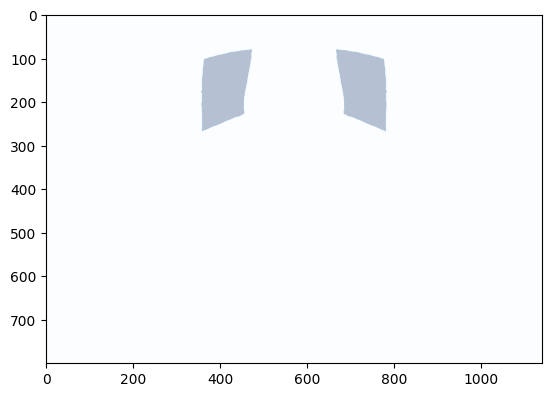

In [29]:
#plot structure mask
fig,ax=plt.subplots(1,1)
ax.imshow(parent_mask[coord[0],:,:],cmap='Blues',alpha=0.3)


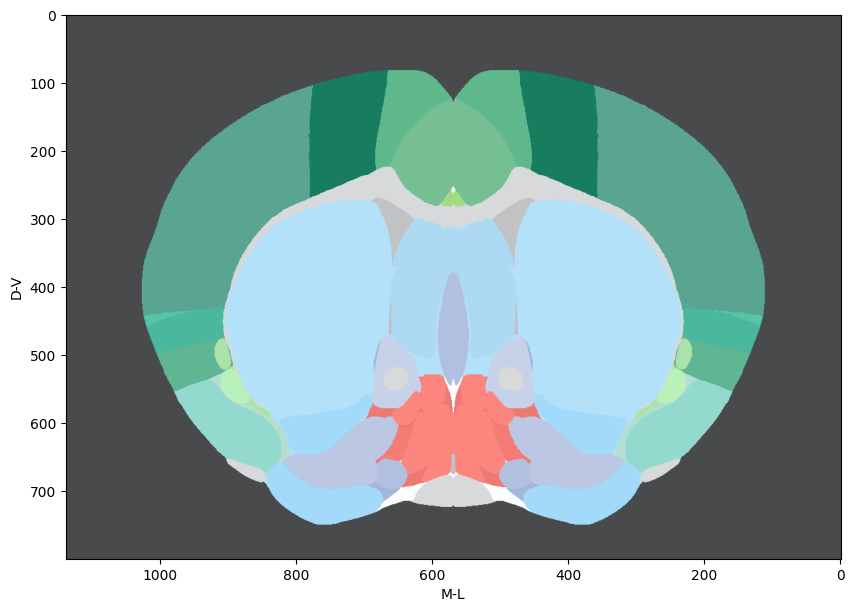

In [41]:
#plot coronal section
#coronal slice at neuron's location
data = rsp.get_slice_image(0, coord[0]*10)

fig = plt.figure(figsize=(10,9))
ax=plt.subplot(1,1,1)
ax.imshow(data,extent=[1140,0,800,0], cmap = 'Grays') 
ax.imshow(parent_mask[coord[0],:,:],cmap='Blues',alpha=0.3)
# ax.imshow(structure_mask[coord[0],:,:],cmap='Reds',alpha=0.3)
# ax.plot(coord[2],coord[1],'r*')
ax.set_xlabel('M-L')
ax.set_ylabel('D-V')
plt.gca().invert_xaxis() #for some reason necessary to make left=left

## CCF slices

In [ ]:
# load deocder accuracy by CCF area
csv_path = r"C:\Users\shailaja.akella\Dropbox (Personal)\DR\figure_final_pdfs\GLM\results"

ccf_coords_by_session_area = pd.read_csv(csv_path + '/GLM_fullmodel_all_details.csv')

select_structures = np.load(csv_path + '/area_list_post_check.npy')

In [99]:
sel_area = 'MOp'
area_mask=rsp.make_structure_mask([id_acronym_map[sel_area]])
img = rsp.get_slice_image(0, slice_pos)
plotting_mask = np.max(area_mask[:,:,:],axis=1)

print(area_mask.shape)
print(gray_img.shape)
print(img.shape)
print(plotting_mask.shape)

(1320, 800, 1140)
(800, 1140)
(800, 1140, 3)
(1320, 1140)


MOs
MOp
MB


KeyboardInterrupt: 

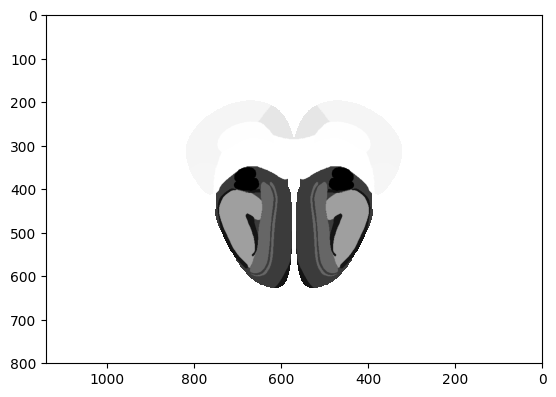

In [90]:
# coronal

structure_list = [structure for structure in ccf_coords_by_session_area.structure.unique() if structure in id_acronym_map.keys()]
dprime_threshold=1

area_insertions = pd.DataFrame()
#horizontal view


slice_size=500
slice_pos_array=np.arange(2000+slice_size/2,10500,slice_size)
for slice_pos in slice_pos_array:
    
    colormaps = [
        'viridis', 'plasma', 'inferno', 'magma', 'cividis',  # Perceptually uniform sequential
        'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds',  # Sequential colormaps
        'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu',  # Sequential colormaps
        'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn',  # Sequential colormaps
        'bone', 'pink', 'spring', 'summer', 'autumn', 'winter',  # Miscellaneous colormaps
        'cool', 'Wistia', 'hot', 'afmhot', 'gist_heat', 'copper',  # Miscellaneous colormaps
        'PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu', 'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic',  # Diverging colormaps
        'twilight', 'twilight_shifted', 'hsv',  # Cyclic colormaps
        'tab10', 'tab20', 'tab20b', 'tab20c',  # Qualitative colormaps
        'Pastel1', 'Pastel2', 'Paired', 'Set1', 'Set2', 'Set3', 'Dark2', 'Accent'  # Qualitative colormaps
    ]
    
    img = rsp.get_slice_image(0, slice_pos)
    gray_img = 0.2989 * img[:, :, 0] + 0.5870 * img[:, :, 1] + 0.1140 * img[:, :, 2]
    gray_img[gray_img == 0] = np.nan
    fig,ax=plt.subplots(1,1)
    ax.imshow(gray_img, extent=[1140,0,800,0], cmap = 'Grays')

    for sel_area in structure_list:        
        area_insertions= pd.concat([area_insertions,ccf_coords_by_session_area.query('ccf_ap >= @slice_pos-500 and structure.str.startswith(@sel_area) and ccf_ap <= @slice_pos+500 and cross_modal_dprime>@dprime_threshold')],axis=0)
        if len(area_insertions) == 0:
            continue
        print(sel_area)
        area_mask=rsp.make_structure_mask([id_acronym_map[sel_area]])
        area_mask = area_mask*gray_img
        plotting_mask = np.max(area_mask[:,:,:],axis=1)
        plotting_mask = plotting_mask.astype(float)
        plotting_mask[plotting_mask == 0] = np.nan
        
        random_cmap = random.choice(colormaps)
        colormaps.remove(random_cmap)  
        
        ax.imshow(plotting_mask, extent=[1140,0,800,0], cmap = random_cmap,alpha=0.5, label=sel_area)
    ax.set_xlabel('ML')
    ax.set_ylabel('AP')
    ax.set_aspect('equal')
    ax.legend(title='Areas')
    plt.tight_layout()
#         fig.colorbar(ax=ax,mappable=points)

In [9]:
area_mask=rsp.make_structure_mask(structure_id_list)

#horizontal view
fig,ax=plt.subplots(1,1)
ax.imshow(np.max(area_mask[:,:,:],axis=1),cmap='gray',alpha=0.5)
# points=ax.scatter(area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['ccf_ml'].mean()/10,
#                   area_insertions[area_insertions['context drop score'] > 0][area_insertions['context drop score'] > 0].groupby('session_id')['ccf_ap'].mean()/10,
#                   c=area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['context drop score'].mean() ,alpha=0.8)
ax.set_xlabel('ML')
ax.set_ylabel('AP')
ax.set_title(structure_list)
ax.set_aspect('equal')
fig.colorbar(ax=ax,mappable=points)


KeyboardInterrupt



## plot decoder accuracy on CCF

In [8]:
# load deocder accuracy by CCF area
csv_path = r"C:\Users\shailaja.akella\Dropbox (Personal)\DR\figure_final_pdfs\GLM\results"

ccf_coords_by_session_area = pd.read_csv(csv_path + '/GLM_fullmodel_all_details.csv')

In [9]:
#make structure mask and collect decoder accuracy for these areas
# structure_list=['MOs','MOp','SS','ORB','FRP','ACA','ILA','PL','AI','RSP','VIS','AUD','PTLp']
structure_list=['MOs']
# structure_list=['CP']
dprime_threshold=1

area_insertions=ccf_coords_by_session_area.query('structure.str.startswith(@structure_list[0]) and cross_modal_dprime>@dprime_threshold')
structure_id_list=[id_acronym_map[structure_list[0]]]

if len(structure_list)>1:
    for sel_area in structure_list[1:]:
        area_insertions=pd.concat([area_insertions,ccf_coords_by_session_area.query('area.str.startswith(@sel_area) and cross_modal_dprime>@dprime_threshold')],axis=0)
        structure_id_list.append(id_acronym_map[sel_area])

area_mask=rsp.make_structure_mask(structure_id_list)

C:\Users\shailaja.akella\AppData\Local\Temp\ipykernel_41784\1281259002.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  area_insertions[area_insertions['context drop score'] > 0][area_insertions['context drop score'] > 0].groupby('session_id')['ccf_ap'].mean()/10,


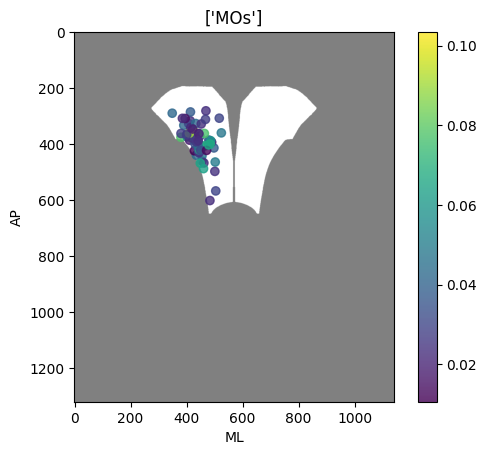

In [10]:
#horizontal view
fig,ax=plt.subplots(1,1)
ax.imshow(np.max(area_mask[:,:,:],axis=1),cmap='gray',alpha=0.5)
points=ax.scatter(area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['ccf_ml'].mean()/10,
                  area_insertions[area_insertions['context drop score'] > 0][area_insertions['context drop score'] > 0].groupby('session_id')['ccf_ap'].mean()/10,
                  c=area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['context drop score'].mean() ,alpha=0.8)
ax.set_xlabel('ML')
ax.set_ylabel('AP')
ax.set_title(structure_list)
ax.set_aspect('equal')
fig.colorbar(ax=ax,mappable=points)

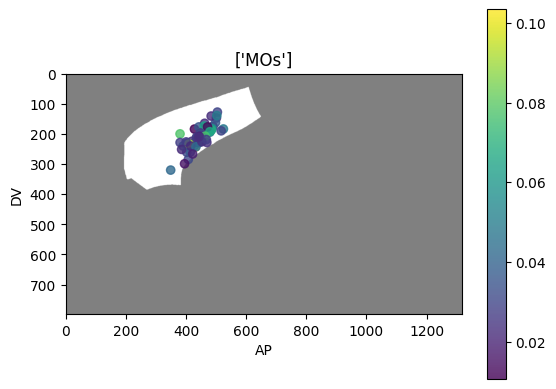

In [11]:
#sagittal view
fig,ax=plt.subplots(1,1)
ax.imshow(np.max(area_mask[:,:,:],axis=2).T,cmap='gray',alpha=0.5)
points=ax.scatter(area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['ccf_ml'].mean()/10,
                  area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['ccf_dv'].mean()/10,
                  c=area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['context drop score'].mean(),
                  alpha=0.8)
ax.set_xlabel('AP')
ax.set_ylabel('DV')
ax.set_title(structure_list)
ax.set_aspect('equal')
fig.colorbar(ax=ax,mappable=points)

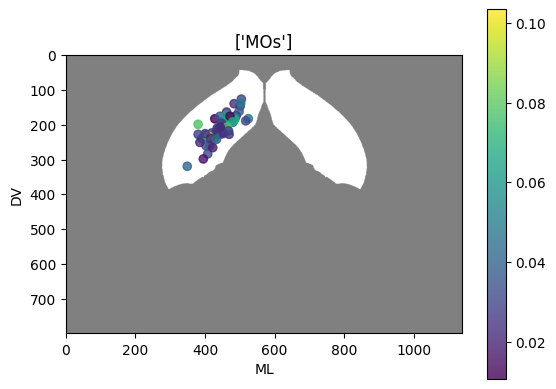

In [12]:
#coronal view
fig,ax=plt.subplots(1,1)
ax.imshow(np.max(area_mask[:,:,:],axis=0),cmap='gray',alpha=0.5)
points=ax.scatter(area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['ccf_ml'].mean()/10,
                  area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['ccf_dv'].mean()/10,
                  c=area_insertions[area_insertions['context drop score'] > 0].groupby('session_id')['context drop score'].mean(),
                  alpha=0.8)
ax.set_xlabel('ML')
ax.set_ylabel('DV')
ax.set_title(structure_list)
ax.set_aspect('equal')
fig.colorbar(ax=ax,mappable=points)

## plot decoding results on CCF slices - coronal

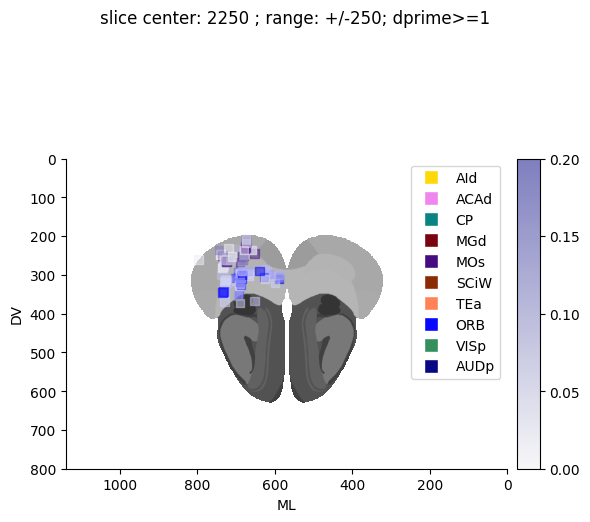

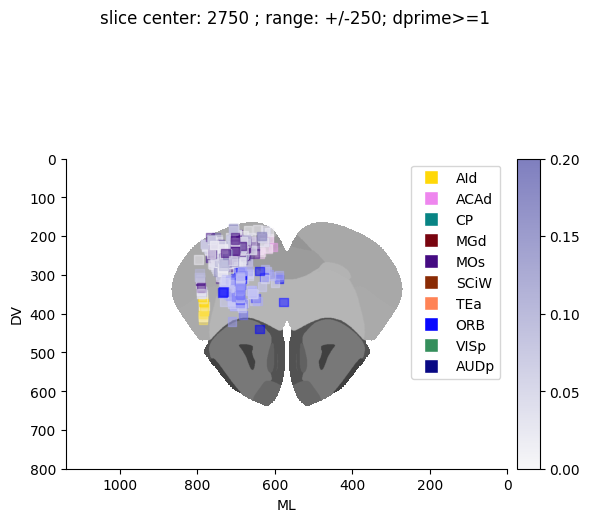

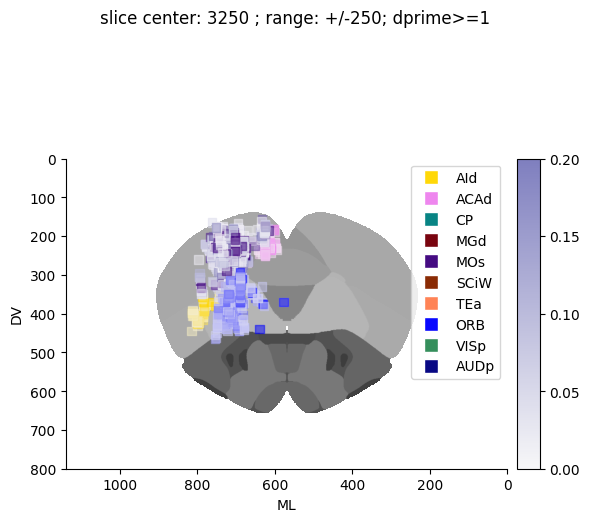

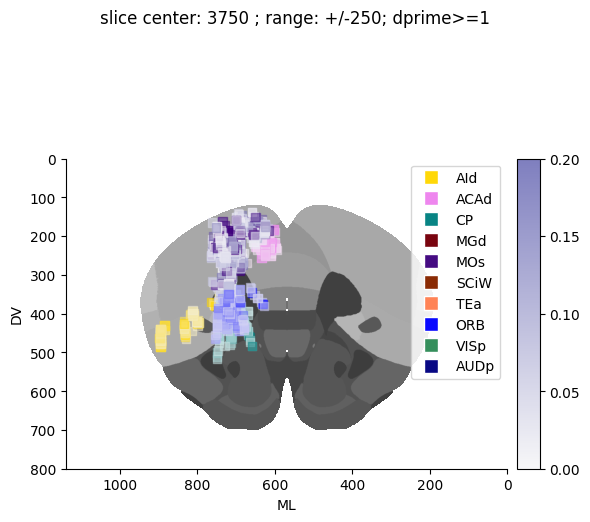

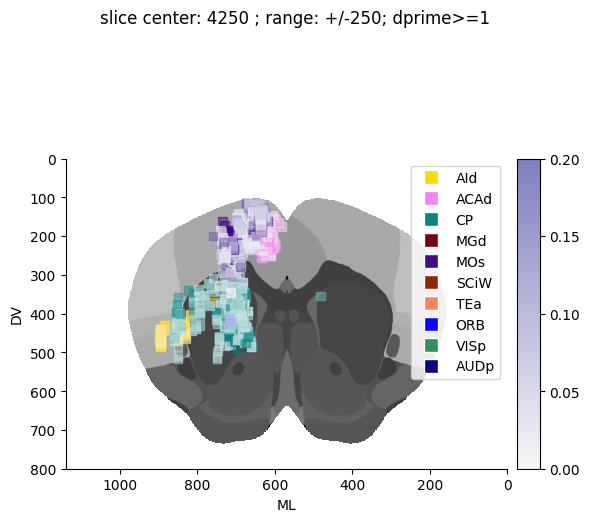

...

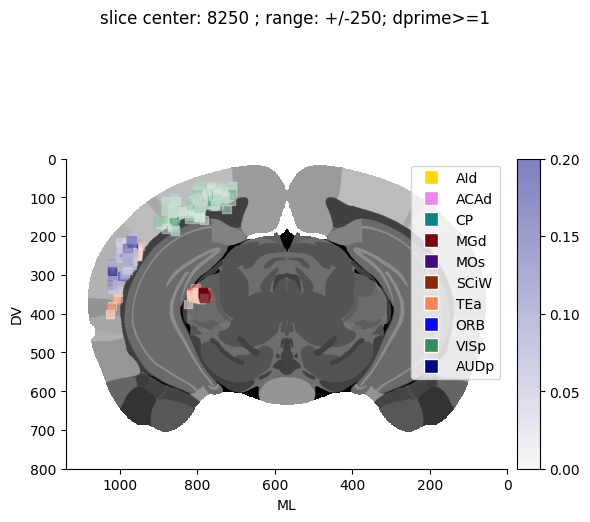

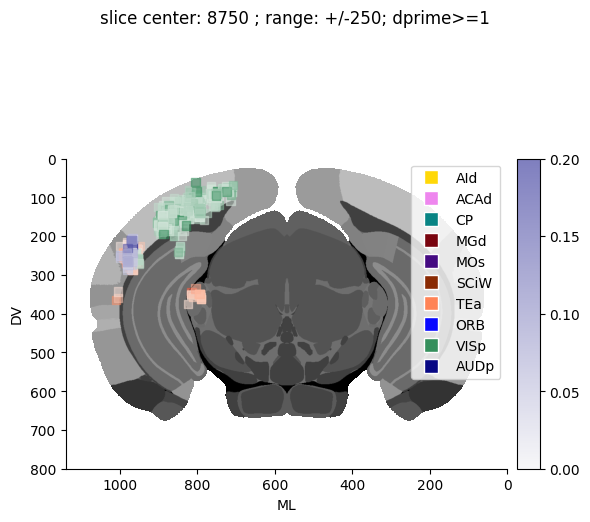

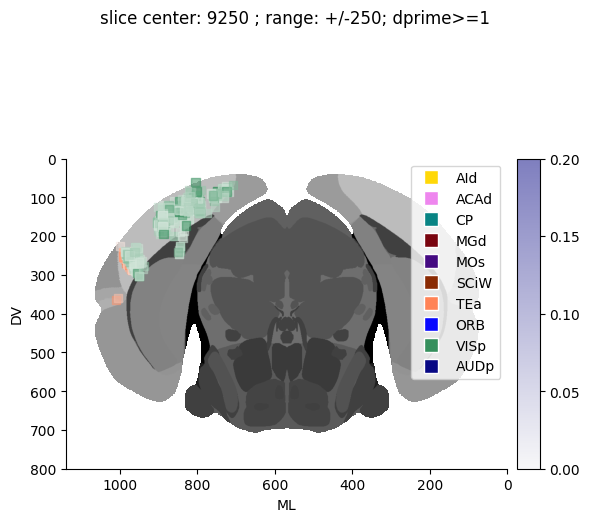

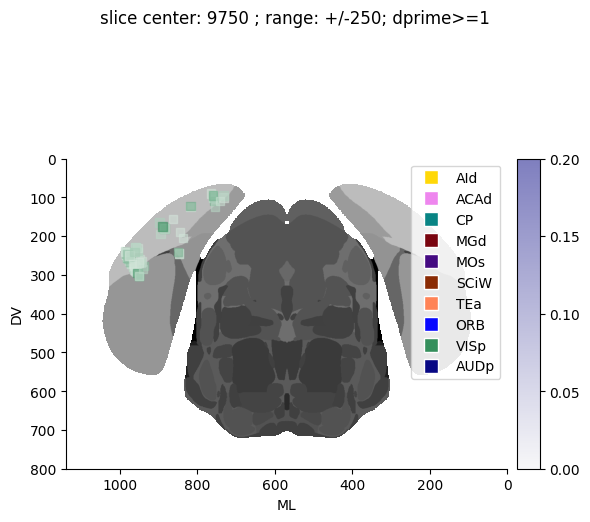

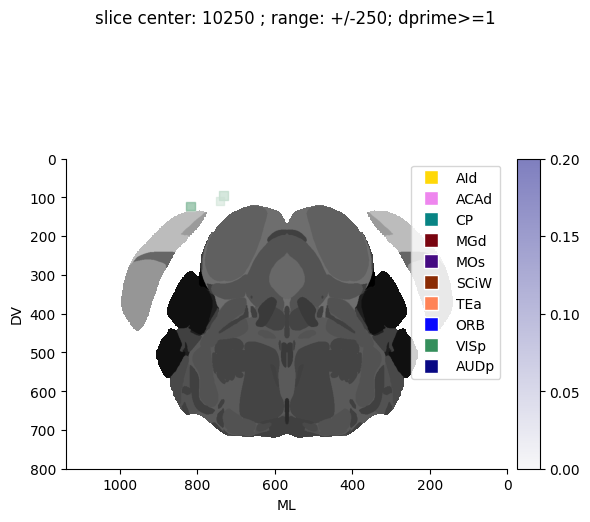

In [46]:
%matplotlib inline

from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
from matplotlib.lines import Line2D

# plot single coronal slice
slice_size=500
slice_pos_array=np.arange(2000+slice_size/2,10500,slice_size)

# Define unique colormaps going from white to a single color
structure_colors = [
    sns.light_palette("gold", as_cmap=True),
    sns.light_palette("violet", as_cmap=True),
    sns.light_palette("teal", as_cmap=True),
    'Reds',  # Light Red to Red
    'Purples',  # Light Purple to Purple
    'Oranges',  # Light Orange to Orange
    sns.light_palette("coral", as_cmap=True), 
    sns.color_palette("light:b", as_cmap=True),  
    sns.light_palette("seagreen", as_cmap=True), 
    sns.light_palette("navy", as_cmap=True)
]

structure_labels = np.array(['AId', 'ACAd', 'CP', 'MGd', 'MOs', 'SCiW', 'TEa', 'ORB', 'VISp', 'AUDp'])

# Plotting
for slice_pos in slice_pos_array: 
    slice_image = rsp.get_slice_image(0, slice_pos)

    def rgb2gray(rgb):
        return np.dot(rgb[..., :3], [0.2989, 0.5870, 0.1140])

    gray_image = rgb2gray(slice_image) 

    fig = plt.figure(figsize=(6,6))
    ax = plt.subplot(1,1,1)
    gray_image[gray_image == 0] = np.nan
    ax.imshow(gray_image, extent=[1140, 0, 800, 0], cmap='Grays', vmin=0, vmax=255) 
    
    # Track the handles for the legend
    legend_handles = []

    for sno, structure in enumerate(structure_labels):
        results = ccf_coords_by_session_area.query(
            'ccf_ap >= @slice_pos-500 and structure.str.startswith(@structure) and ccf_ap <= @slice_pos+500 and cross_modal_dprime>@dprime_threshold'
        )
        results = results[results['context drop score'] > 0.02]
        
        sns_colormap = structure_colors[sno]
        points = ax.scatter(
            1140 - results['ccf_ml'] / 10,
            results['ccf_dv'] / 10,
            c=results['context drop score'],
            alpha=0.5,
            cmap=sns_colormap,
            marker='s',
            vmin=0,
            vmax=0.2
        )
        
        # Create a custom legend handle with the darkest color
        if isinstance(sns_colormap, str):
            sns_colormap = plt.get_cmap(sns_colormap)  # Convert string to colormap object
        else:
            sns_colormap = sns_colormap
        color = sns_colormap(np.linspace(0, 1, 256))[-10]  # Get the darkest color from the colormap
        handle = Line2D([0], [0], marker='s', color='w', markerfacecolor=color, markersize=10, linestyle='None')
        legend_handles.append((handle, structure))
    
    # Set labels for the legend
    ax.legend(handles=[handle for handle, _ in legend_handles], labels=[label for _, label in legend_handles])

    ax.set_xlabel('ML')
    ax.set_ylabel('DV')
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)  # size and padding adjustments

    # Add colorbar to the new axes
    colorbar = fig.colorbar(points, cax=cax)

    # Modify colorbar to include only alternate ticks
    ticks = colorbar.get_ticks()  # Get the default ticks
    alternate_ticks = ticks[::2]  # Select alternate ticks (every other tick)
    colorbar.set_ticks(alternate_ticks)  # Set the alternate ticks
    fig.suptitle('slice center: '+str(int(slice_pos))+' ; range: +/-'+str(int(slice_size/2))+'; dprime>='+str(dprime_threshold))

    plt.tight_layout()
    plt.show()

## plot decoding results on CCF slices - horizontal

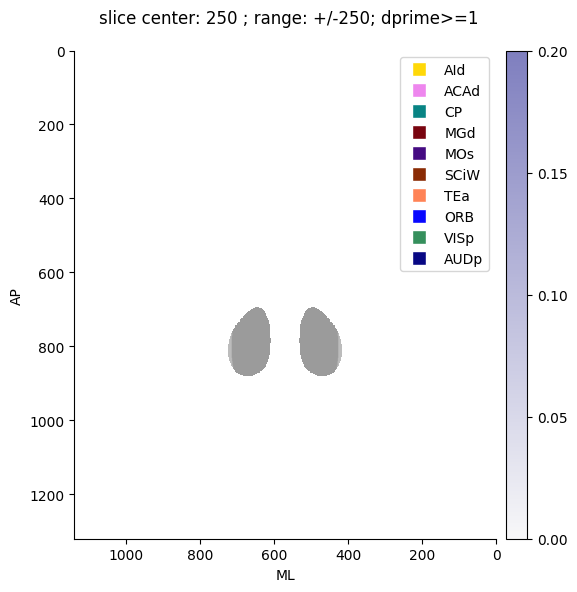

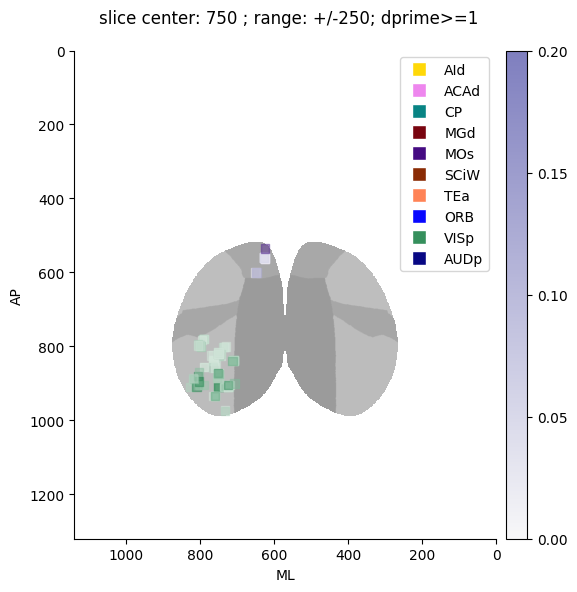

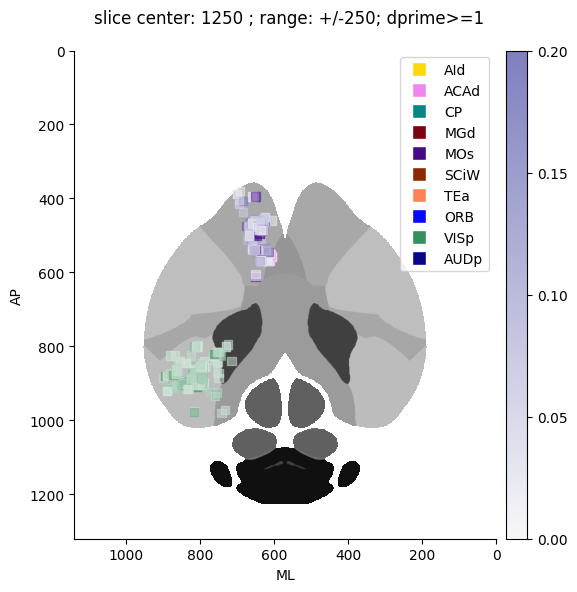

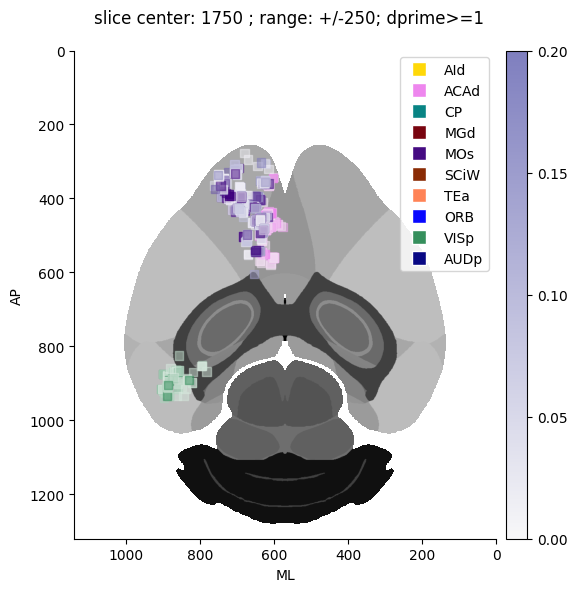

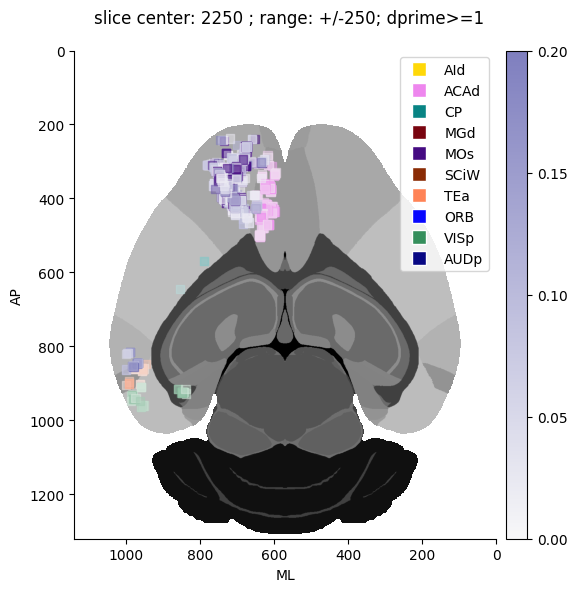

...

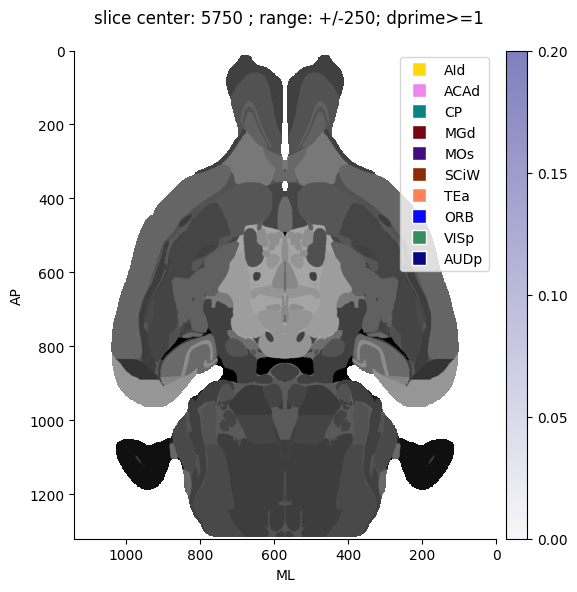

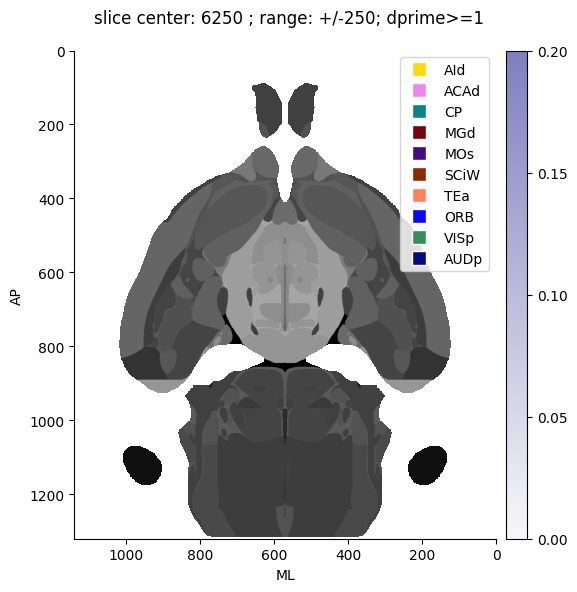

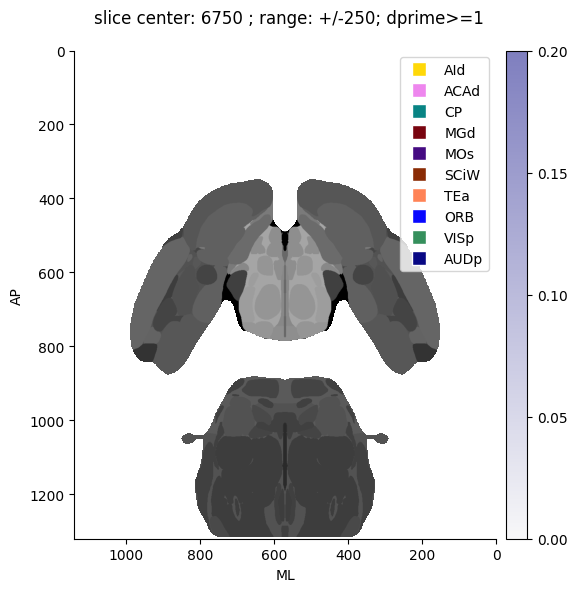

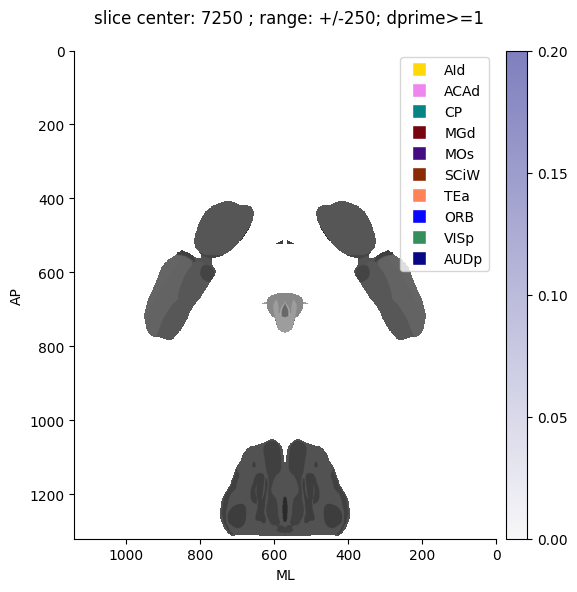

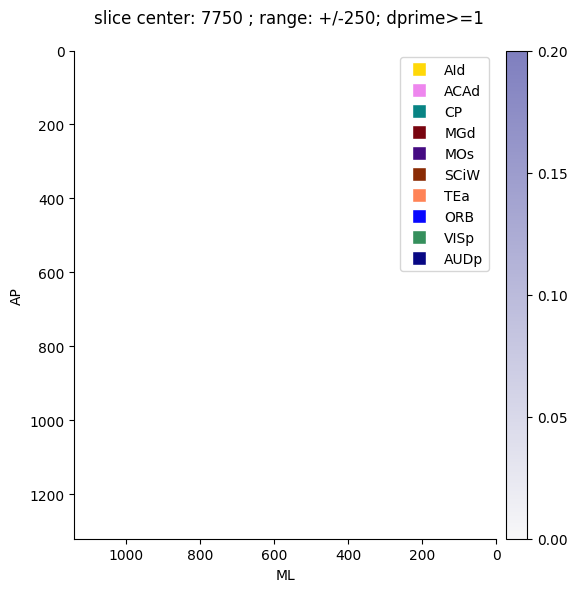

In [62]:
%matplotlib inline

from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
from matplotlib.lines import Line2D

# plot single coronal slice
slice_size=500
slice_pos_array=np.arange(slice_size/2,8000+slice_size/2,slice_size)

# Plotting
for slice_pos in slice_pos_array: 
    slice_image= rsp.get_slice_image(1, slice_pos)

    def rgb2gray(rgb):
        return np.dot(rgb[..., :3], [0.2989, 0.5870, 0.1140])

    gray_image = rgb2gray(slice_image) 

    fig = plt.figure(figsize=(6,6))
    ax = plt.subplot(1,1,1)
    gray_image[gray_image == 0] = np.nan
    ax.imshow(gray_image, extent=[1140,0,1320,0], cmap='Grays', vmin=0, vmax=255) 
    
    # Track the handles for the legend
    legend_handles = []

    for sno, structure in enumerate(structure_labels):
        results = ccf_coords_by_session_area.query(
            'ccf_dv >= @slice_pos-@slice_size/2 and ccf_dv <= @slice_pos+@slice_size/2 and structure.str.startswith(@structure) and cross_modal_dprime>@dprime_threshold'
        )
        results = results[results['context drop score'] > 0.02]
        
        sns_colormap = structure_colors[sno]
        points = ax.scatter(
            1140 - results['ccf_ml'] / 10,
            results['ccf_ap'] / 10,
            c=results['context drop score'],
            alpha=0.5,
            cmap=sns_colormap,
            marker='s',
            vmin=0,
            vmax=0.2
        )
        
        # Create a custom legend handle with the darkest color
        if isinstance(sns_colormap, str):
            sns_colormap = plt.get_cmap(sns_colormap)  # Convert string to colormap object
        else:
            sns_colormap = sns_colormap
        color = sns_colormap(np.linspace(0, 1, 256))[-10]  # Get the darkest color from the colormap
        handle = Line2D([0], [0], marker='s', color='w', markerfacecolor=color, markersize=10, linestyle='None')
        legend_handles.append((handle, structure))
    
    # Set labels for the legend
    ax.legend(handles=[handle for handle, _ in legend_handles], labels=[label for _, label in legend_handles])

    ax.set_xlabel('ML')
    ax.set_ylabel('AP')
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)  # size and padding adjustments

    # Add colorbar to the new axes
    colorbar = fig.colorbar(points, cax=cax)

    # Modify colorbar to include only alternate ticks
    ticks = colorbar.get_ticks()  # Get the default ticks
    alternate_ticks = ticks[::2]  # Select alternate ticks (every other tick)
    colorbar.set_ticks(alternate_ticks)  # Set the alternate ticks
    
    fig.suptitle('slice center: '+str(int(slice_pos))+' ; range: +/-'+str(int(slice_size/2))+'; dprime>='+str(dprime_threshold))

    plt.tight_layout()
    plt.show()

## plot decoding results on CCF slices - saggital

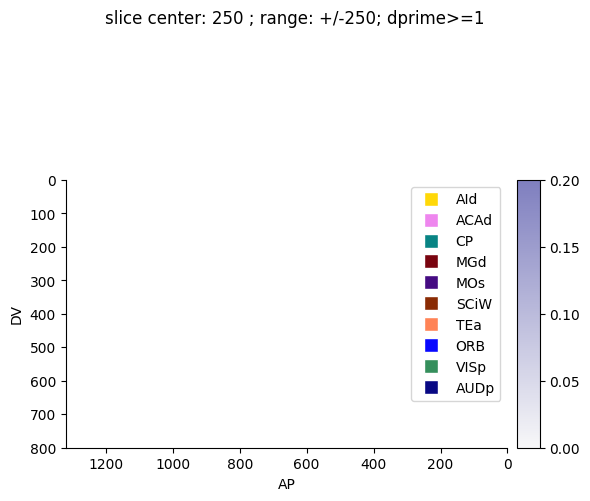

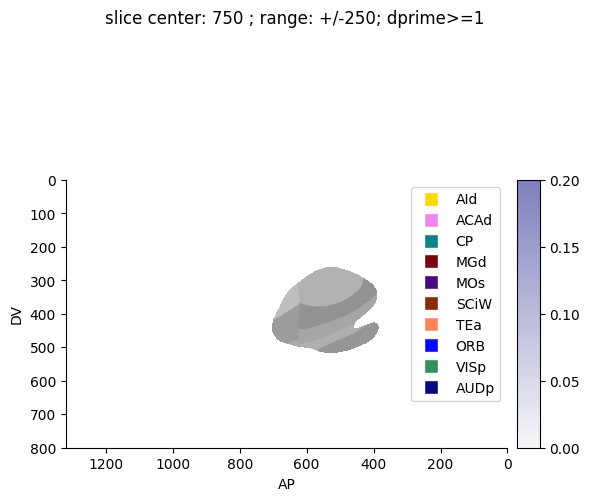

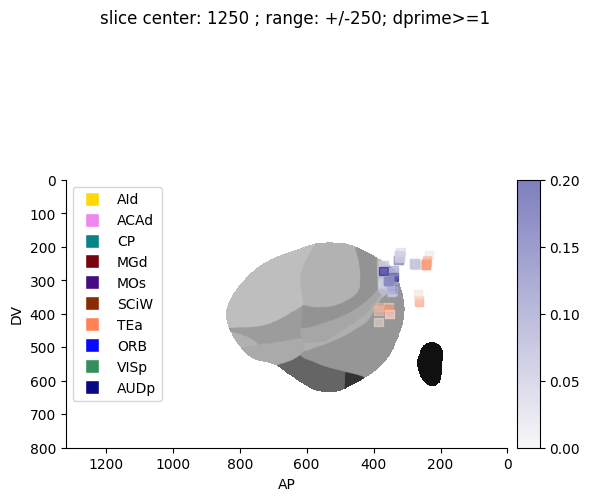

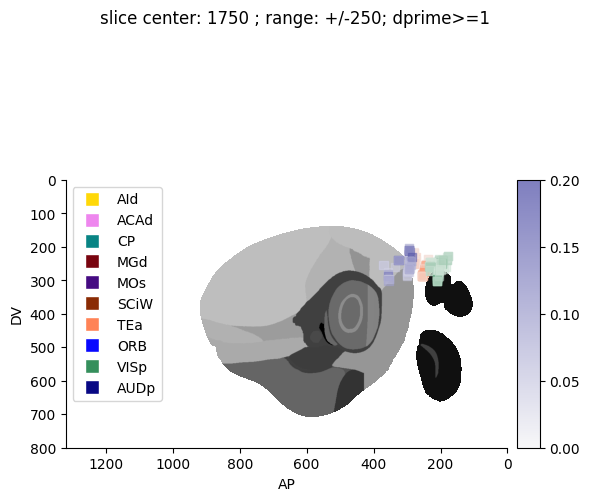

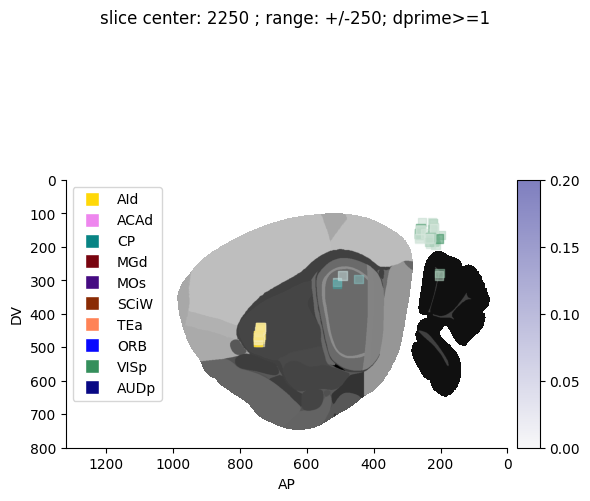

...

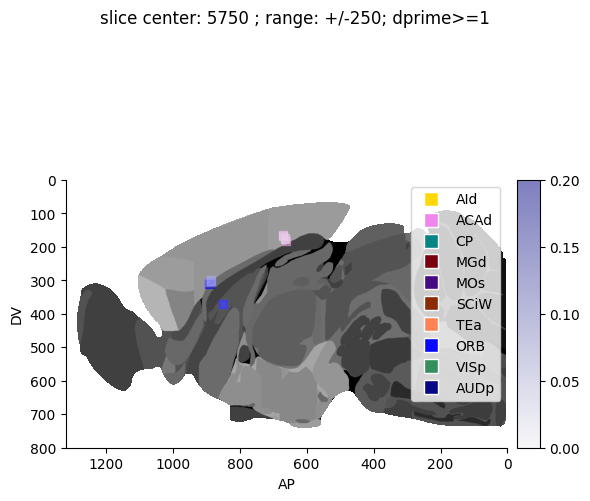

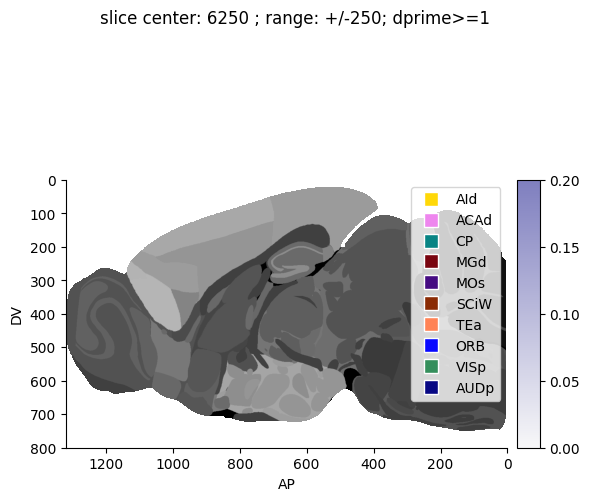

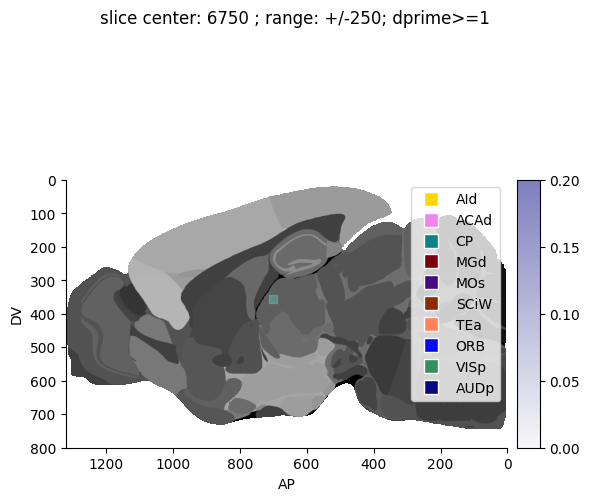

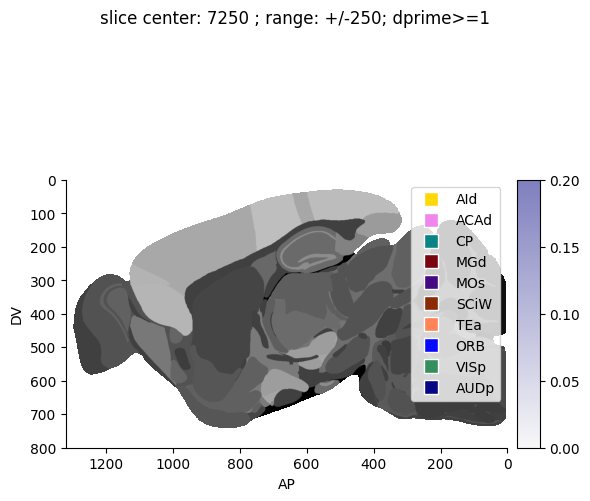

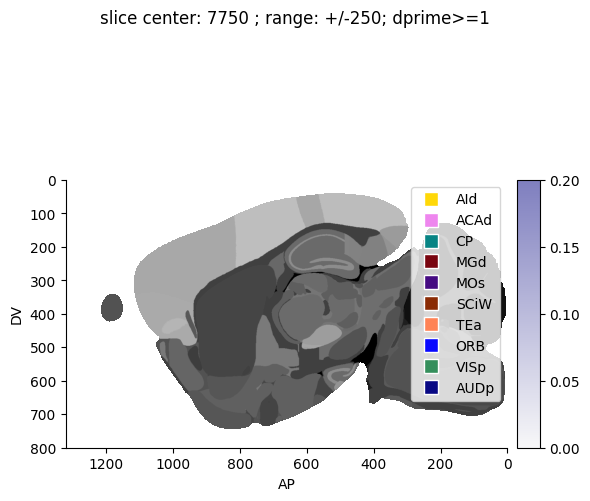

In [64]:
%matplotlib inline

from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
from matplotlib.lines import Line2D

# plot single coronal slice
slice_size=500
slice_pos_array=np.arange(slice_size/2,8000,slice_size)

# Plotting
for slice_pos in slice_pos_array: 
    slice_image= slice_image= rsp.get_slice_image(2, slice_pos)
    
    def rgb2gray(rgb):
        return np.dot(rgb[..., :3], [0.2989, 0.5870, 0.1140])

    gray_image = rgb2gray(slice_image) 

    fig = plt.figure(figsize=(6,6))
    ax = plt.subplot(1,1,1)
    gray_image[gray_image == 0] = np.nan
    ax.imshow(gray_image.T, extent=[1320,0,800,0], cmap='Grays', vmin=0, vmax=255) 
    
    # Track the handles for the legend
    legend_handles = []

    for sno, structure in enumerate(structure_labels):
        results = ccf_coords_by_session_area.query(
            'ccf_ml >= @slice_pos-@slice_size/2 and ccf_ml <= @slice_pos+@slice_size/2 and structure.str.startswith(@structure) and cross_modal_dprime>@dprime_threshold'
        )
        results = results[results['context drop score'] > 0.02]
        
        sns_colormap = structure_colors[sno]
        points = ax.scatter(
            1140 - results['ccf_ap'] / 10,
            results['ccf_dv'] / 10,
            c=results['context drop score'],
            alpha=0.5,
            cmap=sns_colormap,
            marker='s',
            vmin=0,
            vmax=0.2
        )
        
        # Create a custom legend handle with the darkest color
        if isinstance(sns_colormap, str):
            sns_colormap = plt.get_cmap(sns_colormap)  # Convert string to colormap object
        else:
            sns_colormap = sns_colormap
        color = sns_colormap(np.linspace(0, 1, 256))[-10]  # Get the darkest color from the colormap
        handle = Line2D([0], [0], marker='s', color='w', markerfacecolor=color, markersize=10, linestyle='None')
        legend_handles.append((handle, structure))
    
    # Set labels for the legend
    ax.legend(handles=[handle for handle, _ in legend_handles], labels=[label for _, label in legend_handles])

    ax.set_xlabel('AP')
    ax.set_ylabel('DV')
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)  # size and padding adjustments

    # Add colorbar to the new axes
    colorbar = fig.colorbar(points, cax=cax)

    # Modify colorbar to include only alternate ticks
    ticks = colorbar.get_ticks()  # Get the default ticks
    alternate_ticks = ticks[::2]  # Select alternate ticks (every other tick)
    colorbar.set_ticks(alternate_ticks)  # Set the alternate ticks
    
    fig.suptitle('slice center: '+str(int(slice_pos))+' ; range: +/-'+str(int(slice_size/2))+'; dprime>='+str(dprime_threshold))

    plt.tight_layout()
    plt.show()

Text(0, 0.5, 'context drop score')

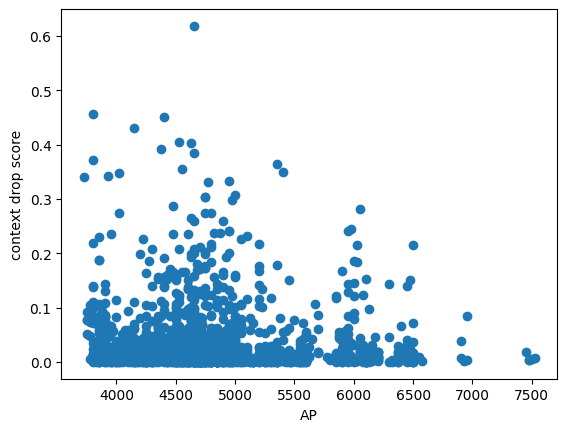

In [65]:
structure = 'CP'
results = ccf_coords_by_session_area.query('cross_modal_dprime>@dprime_threshold and structure.str.startswith(@structure)')
results = results[results['context drop score'] > 0.0]
plt.scatter(results['ccf_ap'], results['context drop score'])
plt.xlabel('AP')

# plt.scatter(results['ccf_dv'], results['context drop score'])
# plt.xlabel('DV')

# plt.scatter(results['ccf_ml'], results['context drop score'])
# plt.xlabel('ML')

plt.ylabel('context drop score')


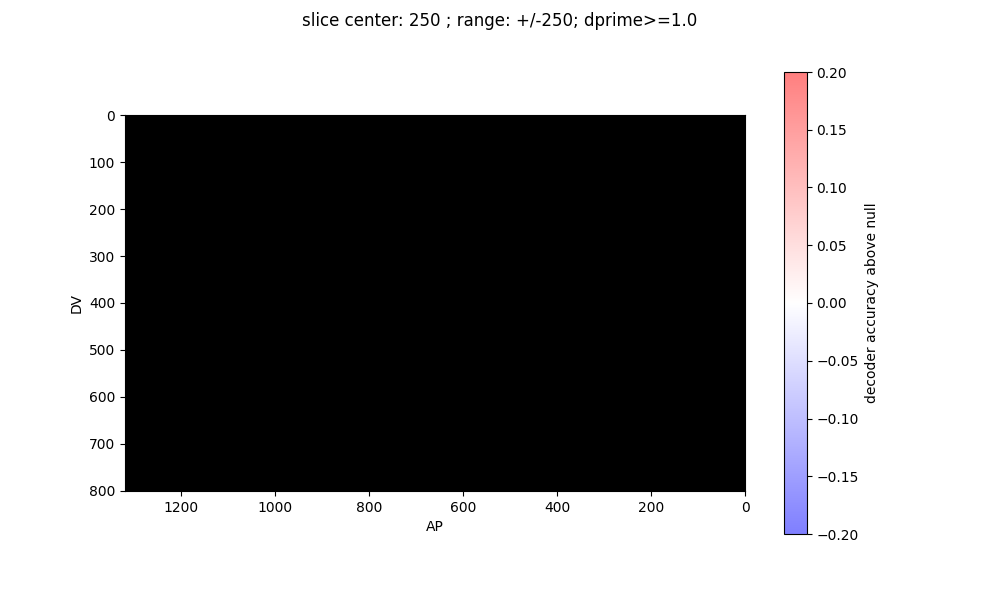

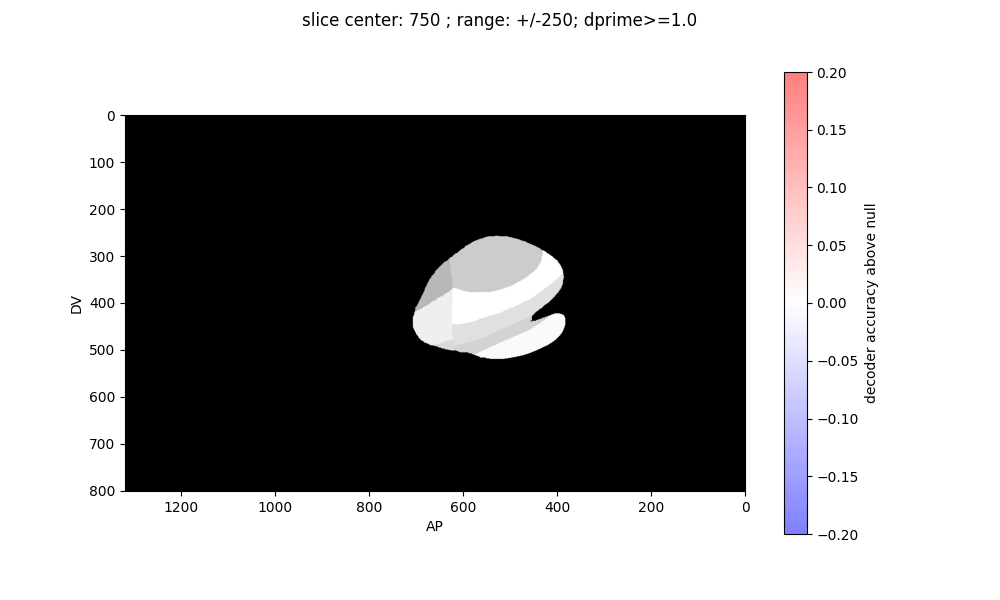

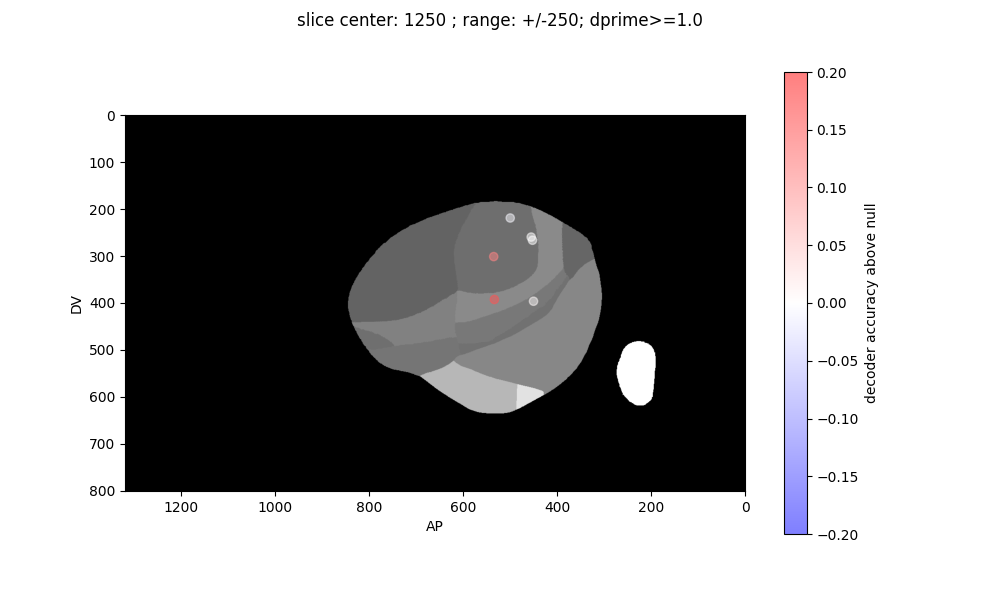

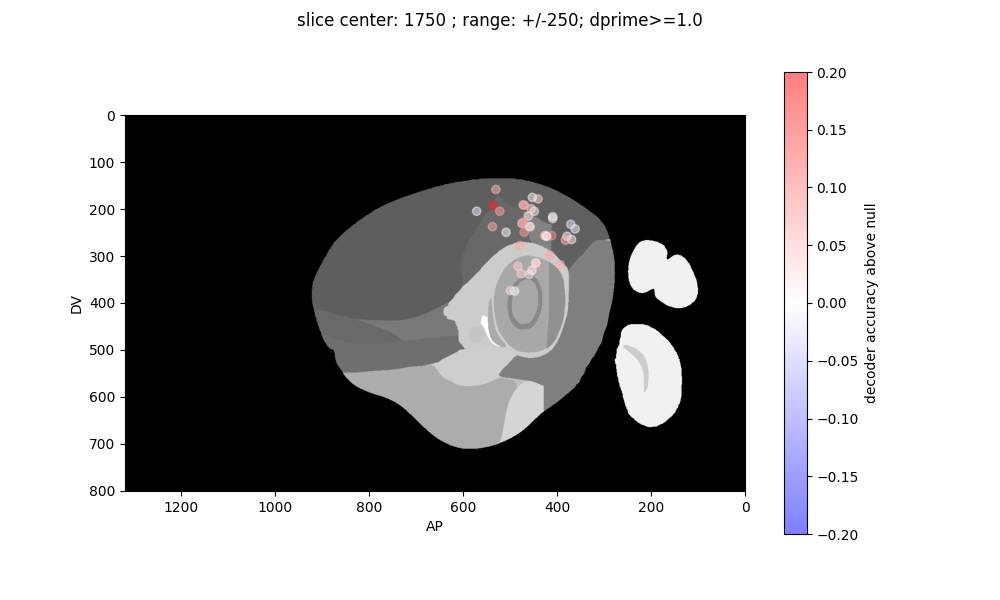

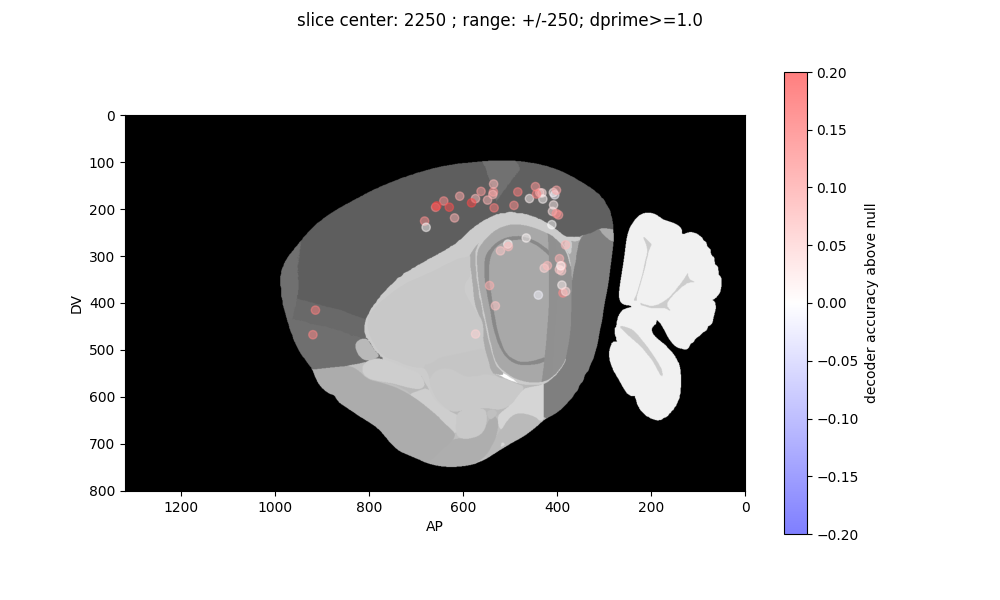

...

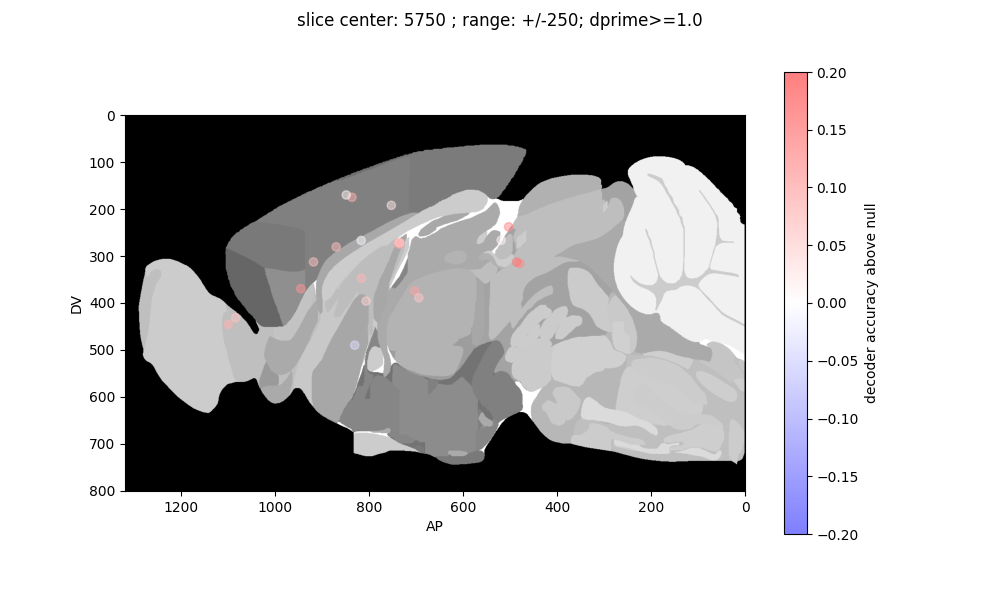

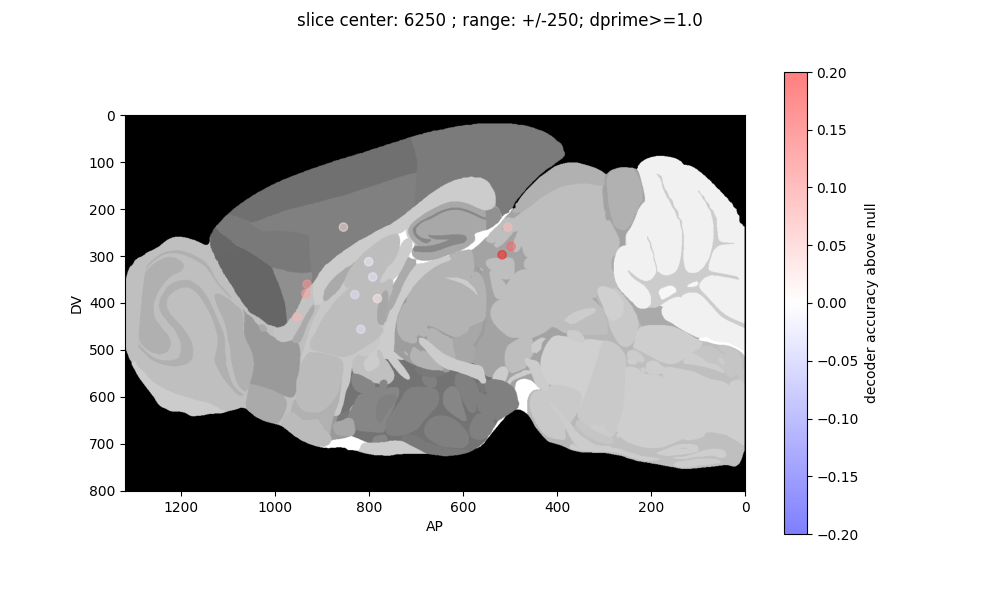

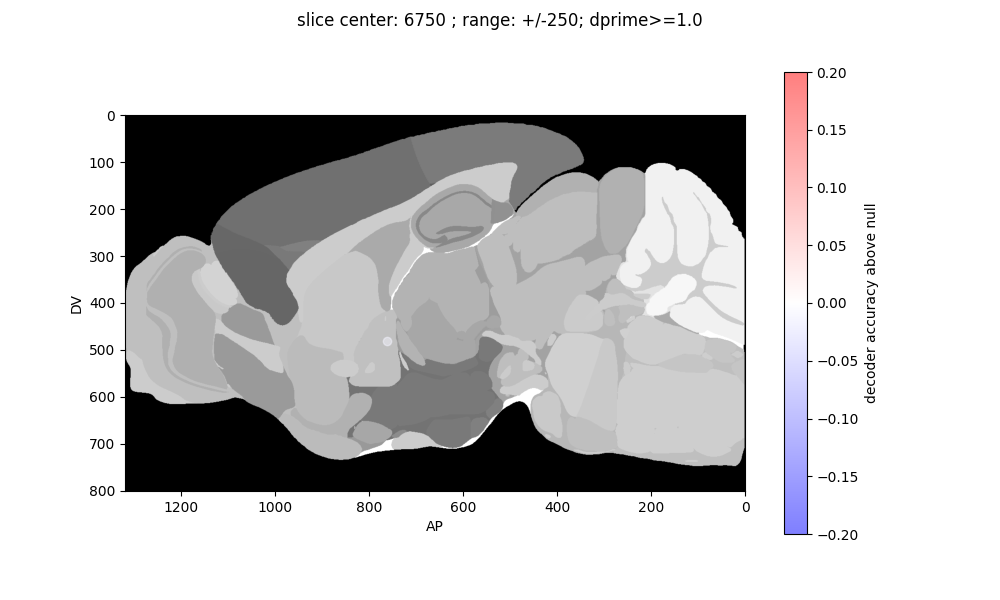

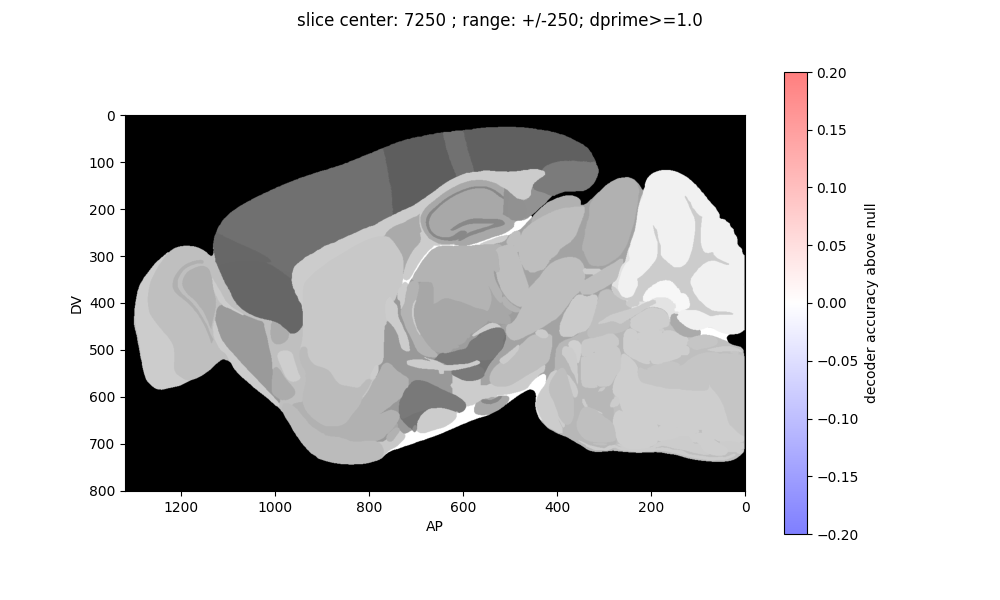

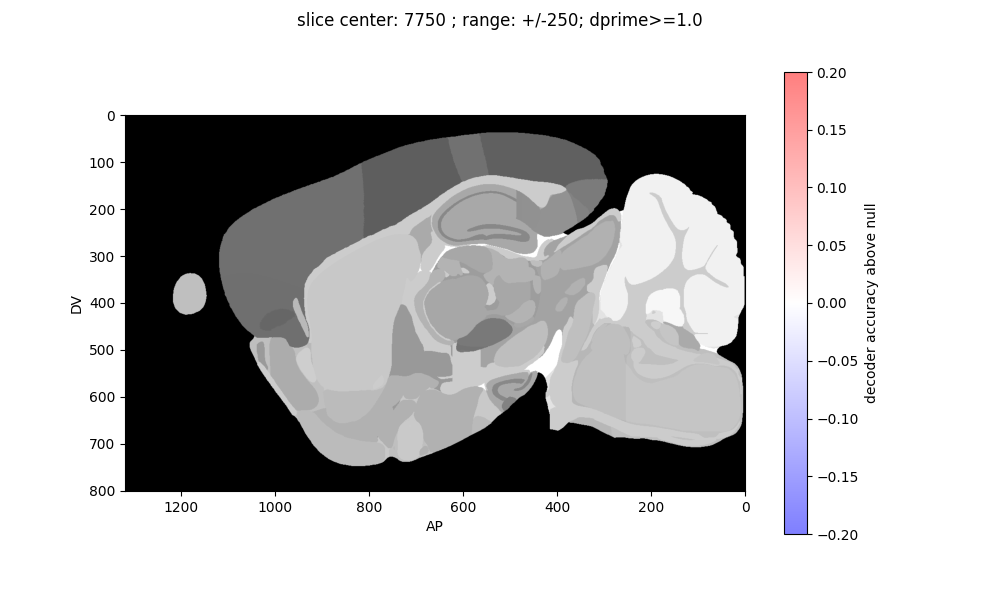

In [16]:
# plot all slices
dprime_thresh=1.0
slice_size=500
slice_pos_array=np.arange(slice_size/2,8000,slice_size)
savepath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\quick figures\2024-05-21-decoding_topography"

for slice_pos in slice_pos_array:
    slice_image= rsp.get_slice_image(2, slice_pos)
    results= ccf_coords_by_session_area.query('ccf_ml_mean >= @slice_pos-@slice_size/2 and ccf_ml_mean <= @slice_pos+@slice_size/2 and \
                                               cross_modal_dprime>=@dprime_thresh and project=="DynamicRouting" and area!="all"')

    def rgb2gray(rgb):
        return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
    
    gray_image = rgb2gray(slice_image) 

    fig = plt.figure(figsize=(10,6))
    ax=plt.subplot(1,1,1)
    ax.imshow(gray_image.T,extent=[1320,0,800,0],cmap='gray') 

    points=ax.scatter(1320-results['ccf_ap_mean']/10,results['ccf_dv_mean']/10,c=results['true_accuracy']-results['null_accuracy_median'],alpha=0.5,cmap='bwr',vmin=-0.2,vmax=0.2)
    ax.set_xlabel('AP')
    ax.set_ylabel('DV')
    fig.colorbar(ax=ax,mappable=points,label='decoder accuracy above null')
    fig.suptitle('slice center: '+str(int(slice_pos))+' ; range: +/-'+str(int(slice_size/2))+'; dprime>='+str(dprime_thresh))

    # filesavepath=os.path.join(savepath,'sagittal_slice_'+str(int(slice_pos))+'.png')
    # plt.savefig(filesavepath,dpi=300)
    # plt.close(fig)

## plot decocer results on CCF - horizontal

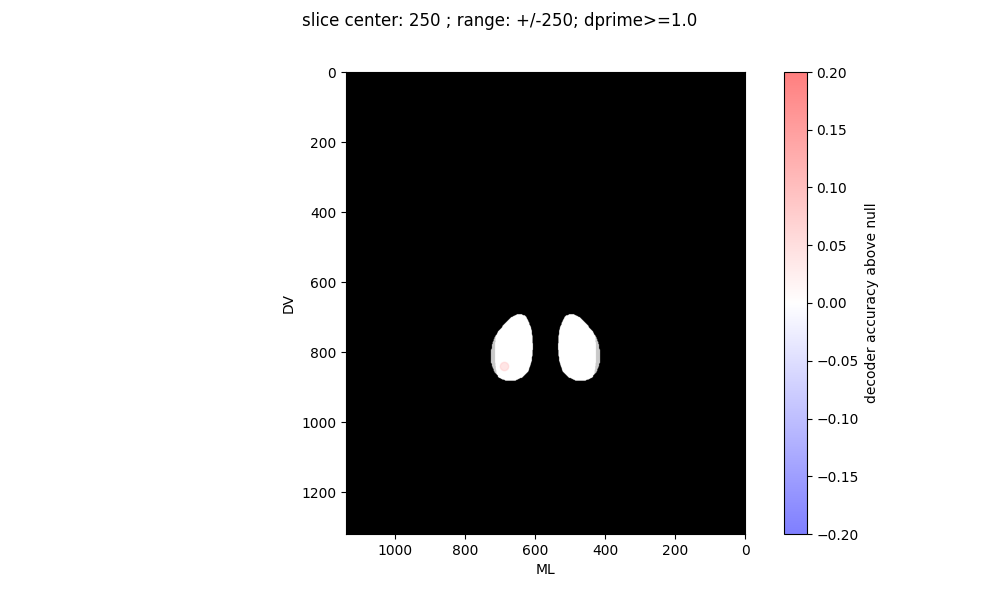

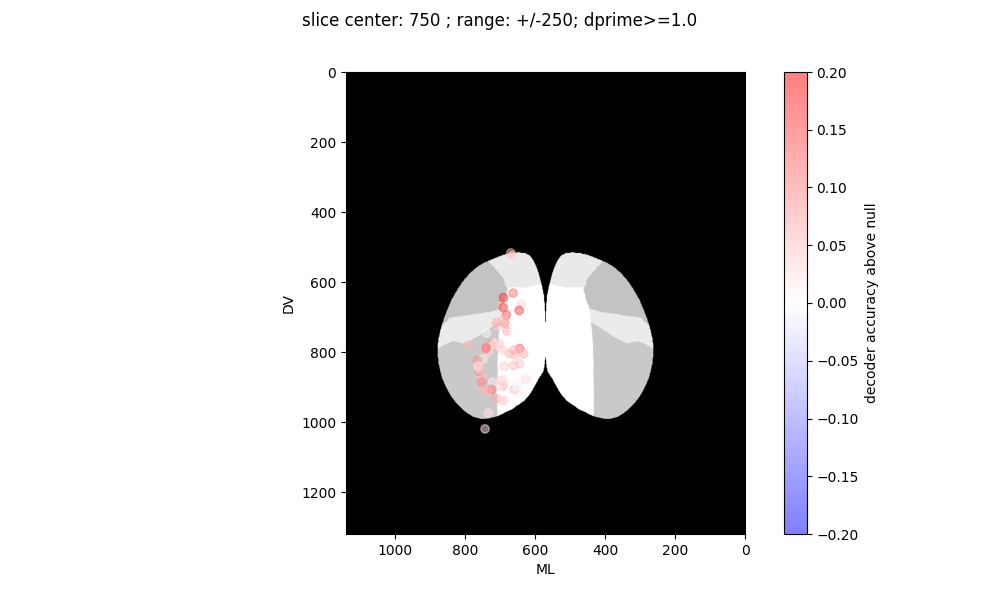

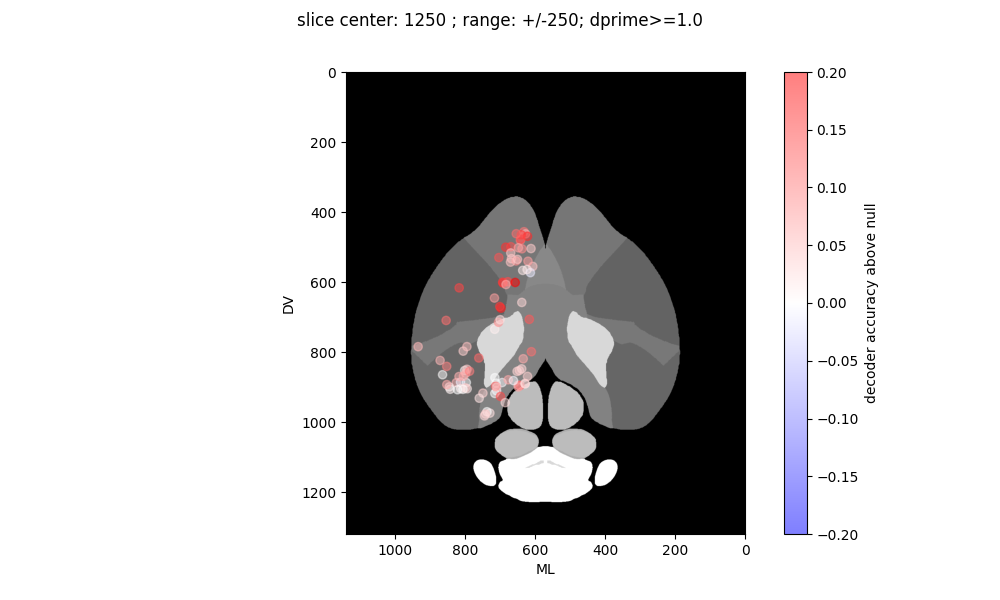

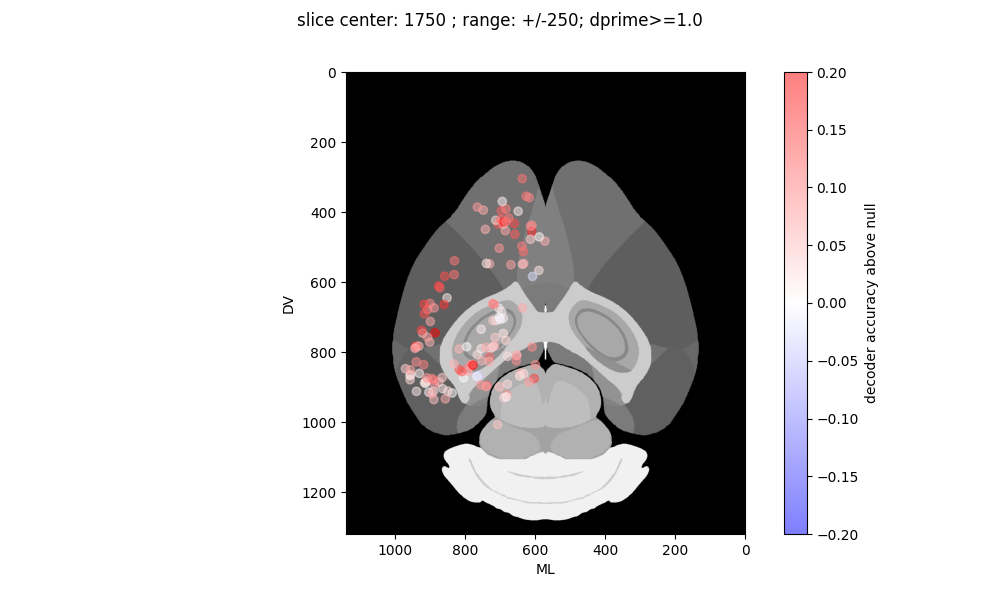

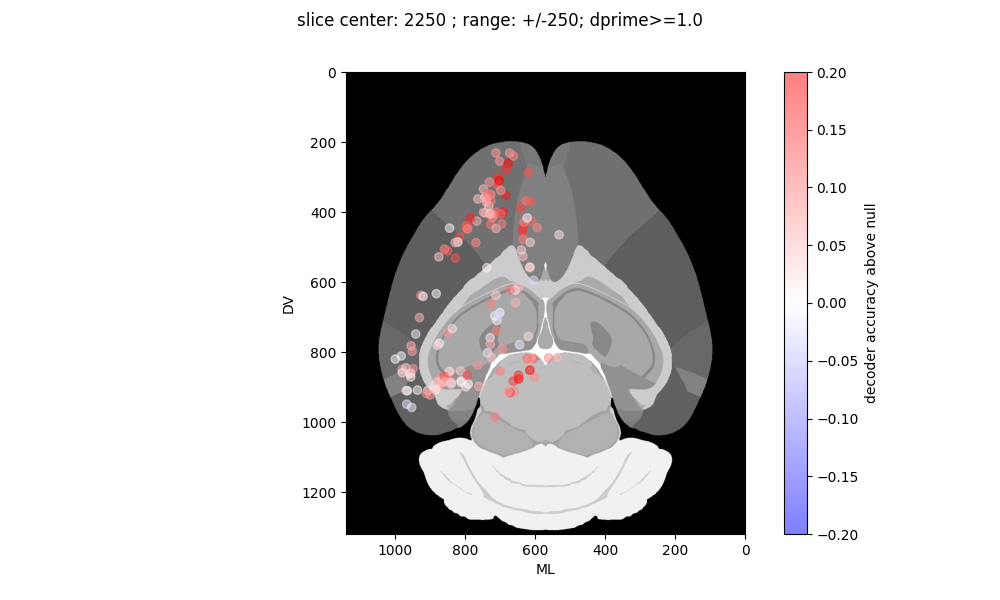

...

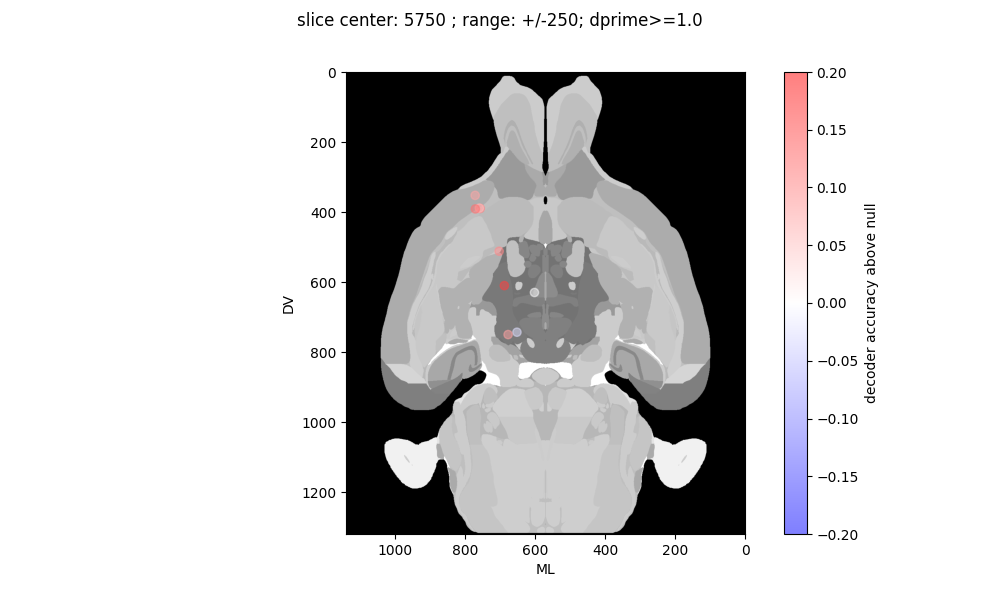

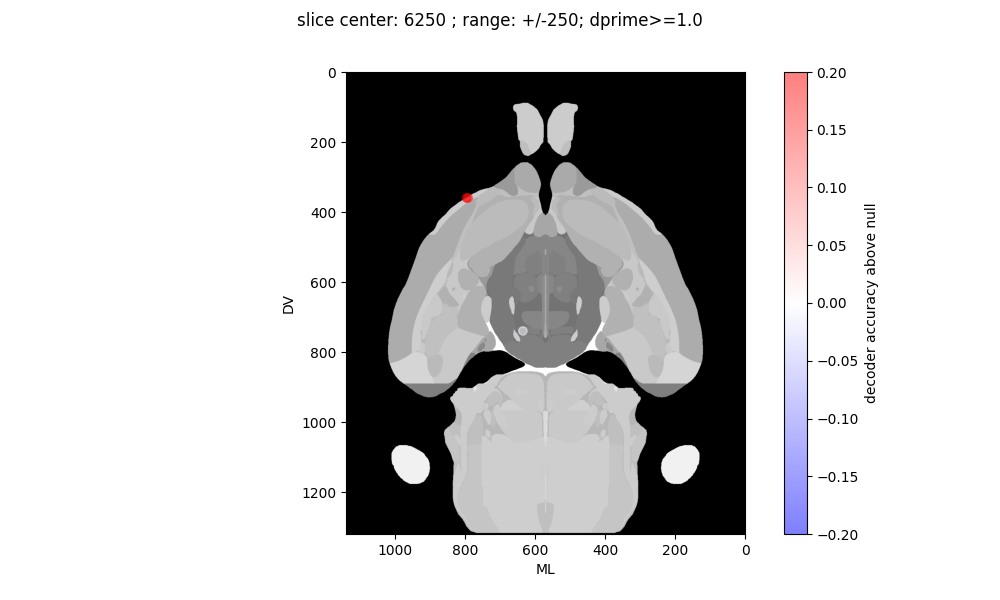

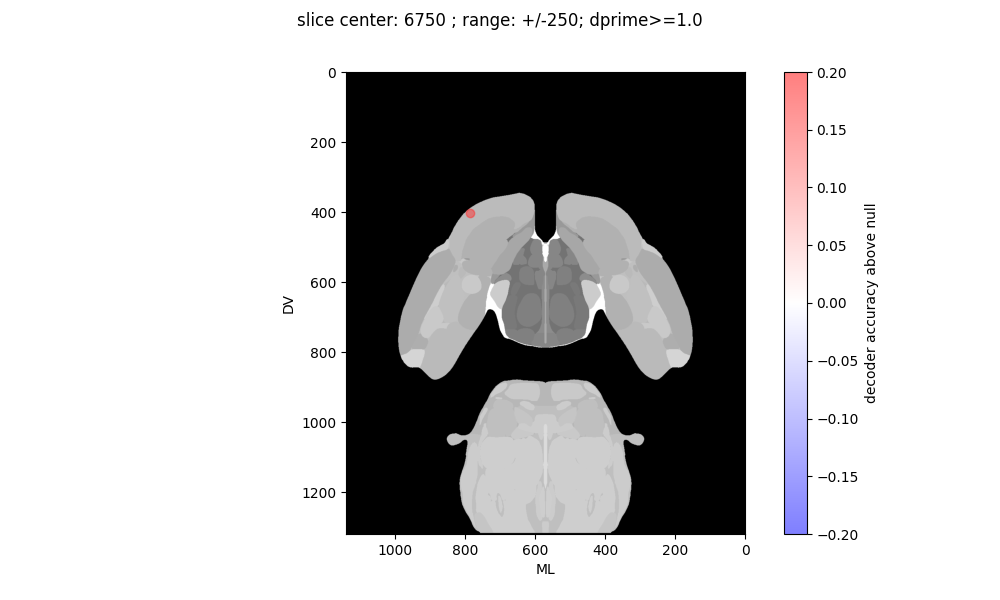

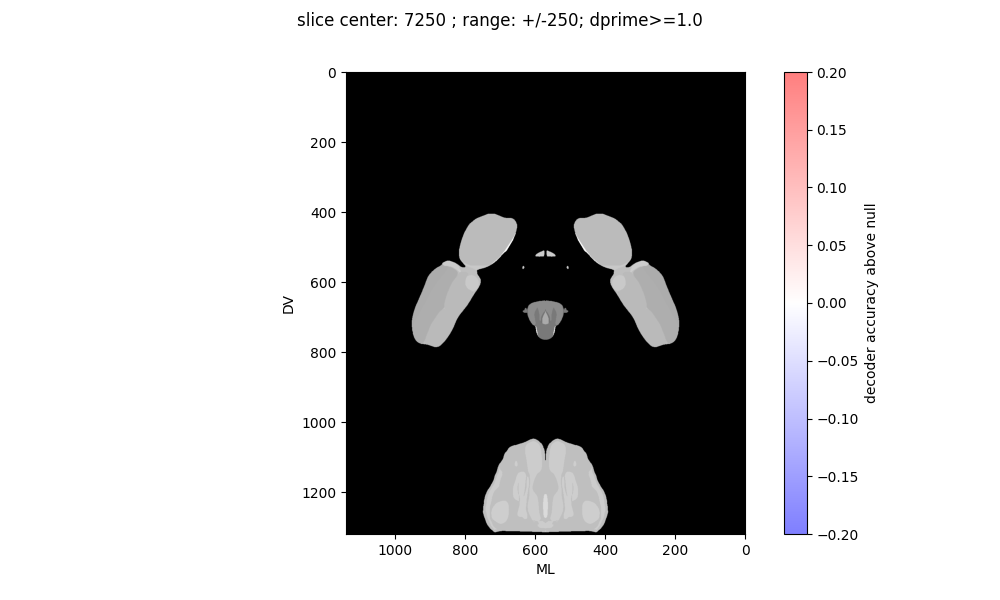

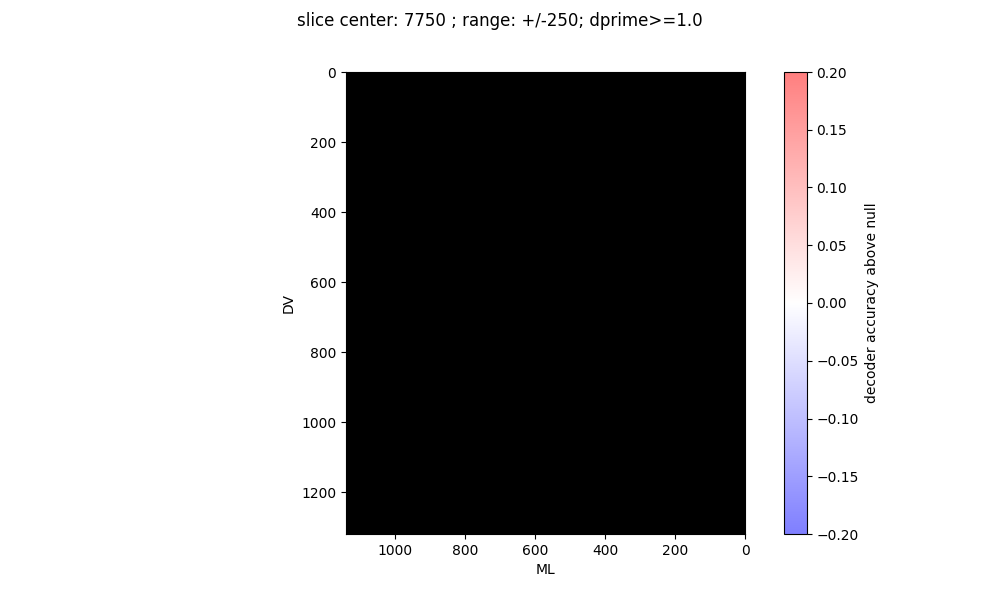

In [15]:
# plot all slices
dprime_thresh=1.0
slice_size=500
slice_pos_array=np.arange(slice_size/2,8000+slice_size/2,slice_size)
savepath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\quick figures\2024-05-21-decoding_topography"

for slice_pos in slice_pos_array:
    slice_image= rsp.get_slice_image(1, slice_pos)
    results= ccf_coords_by_session_area.query('ccf_dv_mean >= @slice_pos-@slice_size/2 and ccf_dv_mean <= @slice_pos+@slice_size/2 and \
                                               cross_modal_dprime>=@dprime_thresh and project=="DynamicRouting" and area!="all"')

    def rgb2gray(rgb):
        return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])
    
    gray_image = rgb2gray(slice_image) 

    fig = plt.figure(figsize=(10,6))
    ax=plt.subplot(1,1,1)
    ax.imshow(gray_image,extent=[1140,0,1320,0],cmap='gray') 

    points=ax.scatter(1140-results['ccf_ml_mean']/10,results['ccf_ap_mean']/10,c=results['true_accuracy']-results['null_accuracy_median'],alpha=0.5,cmap='bwr',vmin=-0.2,vmax=0.2)
    ax.set_xlabel('ML')
    ax.set_ylabel('DV')
    fig.colorbar(ax=ax,mappable=points,label='decoder accuracy above null')
    fig.suptitle('slice center: '+str(int(slice_pos))+' ; range: +/-'+str(int(slice_size/2))+'; dprime>='+str(dprime_thresh))

    # filesavepath=os.path.join(savepath,'horizontal_slice_'+str(int(slice_pos))+'.png')
    # plt.savefig(filesavepath,dpi=300)
    # plt.close(fig)

## plot decoder results on CCF - sagittal